# Generative Adversarial Networks - Monet Painting Translation  
Nick Vastine<br>
DTSA 5511 - Introduction to Deep Learning<br>
Week 5 Assignment<br>
April 7, 2025

---
## __Executive Summary__
The goal of this project was to develop a generative adversarial network (GAN) to translate photos into Monet-style paintings. The project also used the TFRecord format for data management and processing.

A GAN was developed following the CycleGAN architecture. This is common for image translation applications, in this case between the 'photo' and 'painting' domains. CycleGAN involves two autoencoder generators, and two discriminators. Model training accounts for adversarial loss (tricking the discriminator), cycle loss (domain A>B>A reproducibility), and identity loss (domain A>A maintaining features). The autoencoder generators use convolutions and transpose convolutions to respectively downsample/encode and upsample/decode images. The CycleGAN literature recommends several residual block layers in the autoencoder bottleneck, which was replaced by transformation convolution layers for simplicity.

The model performed as expected, incorporating several painterly aspects while maintaining key features of the original image. The output images began quite blurry and with 'flat' color schemes, but over training gradually adopted Monet-style colors and improved image resolution.

A secondary and tertiary model evaluated the effect of weighing cycle and identity loss differently. The secondary model removed cycle and identity losses. This effectively converts the system into two isolated Deep Convolution GAN (DCGAN) systems using our training images as input instead of random noise. This resulted in very poor performance, removing all color information and simply identifying edges with increasing resolution. The tertiary model doubled the weight of cycle and identity losses, which may improve color and resolution retention but this was not quantified.

A final model considered an alternative architecture, incorporating a skip connection similar to UNet architectures. Skip connections (such as those in proposed residual blocks) help retain spatial information which may be lost during encoding. However, this project's implementation of skip connections seemed to override the painterly style.

Further development could create more sample variations for a more robust model, implement residual blocks at the autoencoder bottleneck, incrementally train models at increasing image sizes, and also consider training the model on more abstract art styles to see how it performs on harder tasks.

---
## __Problem Statement__
The goal of this project is to create a Generative Adversarial Network (GAN) which is able to translate photos into paintings in the impressionist style of Claude Monet.

The project is based on the [Kaggle "I’m Something of a Painter Myself" Competition](https://www.kaggle.com/competitions/gan-getting-started).

Since the objective is image translation, a modified CycleGAN architecture will be implemented. CycleGANs are explained in detail in the _Model Architecture_ section. Some variations on the weight of cycle and identity will be evaluated, and a skip connection will be adopted to simulate a basic UNet architecture. 

---
## __Data__
The data for this project is provided in four directories:
* `monet_...` -  Data of Monet's work, used as the 'real' examples when training the discriminator. These are provided in two formats:
    * `monet_jpg` - JPEG images
    * `monet_tfrec` - TFRecord format, "a simple format for storing a sequence of binary records." [(TFRecord and tf.train.Example)](https://www.tensorflow.org/tutorials/load_data/tfrecord). Note that the TFrec files do not correspond one-to-one to the JPG images.
* `photo_...` - General photos which can be used as a basis to generate images.
    * `photo_jpg` - JPEG images
    * `photo_tfrec` - TFRecord format

The competition recommends using TFRecords as a means to learn a new data format. The competition also mentions that the paintings are RGB and sized 256x256 which informs the input layer of the neural networks.

The below code imports the project dependencies, then imports the TFrec data sources, converts to images, and reports the quantity of images in each category.

The competition provides 300 Monet samples and 7300 photos. Only 300 photos will be used to train the generators.

In [36]:
## Package Dependencies
import os
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras import ops
import tensorflow as tf
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import ReLU, LeakyReLU
from tensorflow.keras.layers import BatchNormalization, GroupNormalization
from tensorflow.keras.layers import Conv2D, Conv2DTranspose
from tensorflow.keras.models import Model

In [37]:
## Data Import
# Keras Import Example - https://keras.io/examples/keras_recipes/tfrecord/

## Import local download
# monet_files = tf.io.gfile.glob("gan-getting-started/monet_tfrec/monet*.tfrec")
# photo_files = tf.io.gfile.glob("gan-getting-started/photo_tfrec/photo*.tfrec")

## Google Colab - select files
# from google.colab import files
# uploaded = files.upload()
# monet_files = tf.io.gfile.glob("monet*.tfrec")
# photo_files = tf.io.gfile.glob("photo*.tfrec")

## Kaggle Import
monet_file_path = '/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec'
photo_file_path = '/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec'

monet_files = tf.data.Dataset.list_files(monet_file_path)
photo_files = tf.data.Dataset.list_files(photo_file_path)

print("Monet TFRecord Files:", len(monet_files))
print("Photo TFRecord Files:", len(photo_files))


Monet TFRecord Files: 5
Photo TFRecord Files: 20


In [38]:
## TFRecord Processing
# Still following Keras example
AUTOTUNE = tf.data.AUTOTUNE # Used for parallel processing data import

def decode_image(image):
# Image processing helper function
    IMAGE_SIZE = [256,256]
    image = tf.image.decode_jpeg(image, channels=3)      # Convert binary to jpeg
    # image = tf.cast(image, tf.float32) / 255             # Scale [0,255] to [0,1]
    image = (tf.cast(image, tf.float32) / (255/2)) - 1   # Scale to [-1,1] to use tanh activation
    image = tf.reshape(image, [*IMAGE_SIZE, 3])          # Format to image shape
    return image

def read_tfrecord(example):
# From example record, return decoded image
    tfrecord_format = {"image": tf.io.FixedLenFeature([], tf.string)} # Only extract image
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example["image"])
    return image

def load_dataset(filenames):
# Load dataset helper
    dataset = tf.data.TFRecordDataset(filenames)  # automatically interleaves reads from multiple files
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

In [39]:
# Loading datasets
monet_dataset = load_dataset(monet_files).batch(1) # batch as single images
photo_dataset = load_dataset(photo_files).batch(1)

print("Monet Samples:",len(list(iter(monet_dataset))))
print("Photo Samples:",len(list(iter(photo_dataset))))

Monet Samples: 300
Photo Samples: 7038


---
## __Exploratory Data Analysis__
To understand the dataset, we can evaluate some sample images from each category.

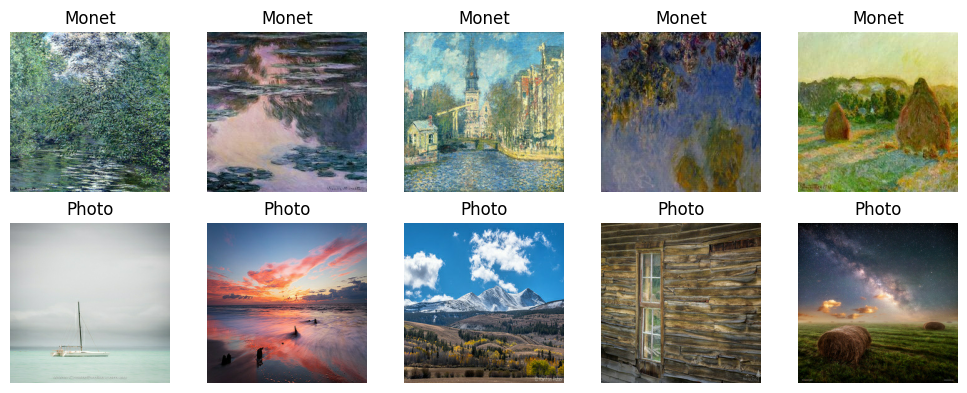

In [5]:
## Visualize examples
fig, axs = plt.subplots(2,5, figsize=(10,4))
i = 0
for ax,monet_example,photo_example in zip(axs.flatten(),iter(monet_dataset),iter(photo_dataset)):
    i += 1
    if i < 6:
        ax.imshow(monet_example[0]*0.5+0.5) # Convert [-1,1] to [0,1] for plotting
        ax.set_title("Monet")
    else:
        ax.imshow(photo_example[0]*0.5+0.5) # Convert [-1,1] to [0,1] for plotting
        ax.set_title("Photo")
    ax.axis('off')
plt.tight_layout()
plt.show()

We can also consider color histograms for the Monet paintings. While the features which distinguish Monet are likely more complex than color alone, they may bias the initial generator toward these color distributions.

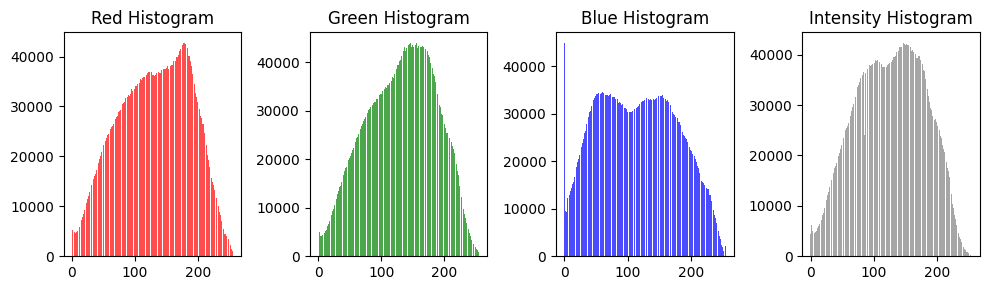

In [6]:
def calculate_batch_histograms_with_intensity(dataset):
    batch_histograms = []
    i = range(0,100) # Sample 100 images
    # For each image (batch), perform histogram calculation for R, G, B, and intensity (average) value
    for i,batch in zip(i,iter(dataset)):
        batch_np = batch.numpy()                # Shape: (batch_size, height, width, 3)
        batch_hist = np.zeros((256, 4))         # Initialize histograms for the batch (256 bins for each R, G, B, Intensity)
        for j, channel in enumerate(range(3)):  # Iterate over R, G, B
            hist, _ = np.histogram((batch_np[..., channel]+1)*255/2, bins=256, range=(0, 255))
            batch_hist[:, j] = hist
        # Compute intensity histogram
        intensity_values = np.mean((batch_np+1)*255/2, axis=-1).flatten()  # Average across the last axis (R, G, B)
        intensity_hist, _ = np.histogram(intensity_values, bins=256, range=(0, 255))
        batch_hist[:, 3] = intensity_hist
        # Log batch histogram in overall histogram
        batch_histograms.append(batch_hist)
    # Sum across all batches for histogram across all images
    return np.sum(np.array(batch_histograms),axis=0)  # Shape: (256, 4)

# Compute histograms for the dataset
monet_batch_histograms = calculate_batch_histograms_with_intensity(monet_dataset)

## Plotting
fig, axs = plt.subplots(1, 4, figsize=(10, 3))
# Lists for iterative plotting
colors = ['red', 'green', 'blue', 'gray']
titles = ['Red Histogram', 'Green Histogram', 'Blue Histogram', 'Intensity Histogram']
# Iterate over axes, colors, and titles
for ax, color, title, data in zip(axs.flatten(), colors, titles, range(4)):
    ax.bar(range(256), monet_batch_histograms[:, data], color=color, alpha=0.7)
    ax.set_title(title)
plt.tight_layout()
plt.show()

---
## __Model Architecture__



### GAN Introduction
A typical Generative Adversarial Network (GAN) has two parts: the generator network and the discriminator network. Since this project is focused on imagery, consider an example to generate images. The generator is responsible for generating new images, or in our case, modifying input images. The discriminator is responsible for determining if the image it is seeing is real or generated. The generator is trained to fool the discriminator, while the disctiminator is trained to thwart the generator. These adversarial networks wage an arms race to out-maneuver the other and identify features which distinguish real from fake.

The structure of each network and their connections depend on the GAN's application. For example, Deep Convolutional GAN (DCGAN) is used to generate brand new images from noise. The generator uses convolutional layers to incrementally upscale the noise into an image, while the discriminator uses convolutions to reduce dimensionality into something easier to classify. The generator and discriminator update their weights when the discriminator is successfully fooled. Balancing the generator and discriminator's learning, the structure of the convolutional layers, and modifying loss functions all contribute to improving DCGAN performance.

### CycleGAN
Where DCGAN is for generation, the CycleGAN structure performs image-to-image transformation. This may be global transformation (such as converting our photos into paintings) or more local transformations (converting a horse into a zebra). CycleGAN is valuable because it does not require paired input-output examples for training. In the case of the horse-zebra model, the model does not need both the horse image and a corresponding transformed zebra image. 

Since we are modifying photos to appear as Monet paintings, we will implement a CycleGAN structure.

Much of my learning comes from these sources:
1. [How to Develop a CycleGAN for Image-to-Image Translation with Keras](https://machinelearningmastery.com/cyclegan-tutorial-with-keras/) from Machine Learning Mastery
    1. Largely based on the [original GAN paper (2017)](https://arxiv.org/abs/1703.10593)
2. [Keras CycleGAN Tutorial](https://keras.io/examples/generative/cyclegan/)
3. [TensorFlow CycleGAN Tutorial](https://www.tensorflow.org/tutorials/generative/cyclegan)

Consider CycleGAN as the transformation between two domains. In our project, domain 1 is our photographs, and we'd like to transform them into paintings in domain 2. For simplicity, I will use 'photos' and 'paintings' to directly refer to the domains.

CycleGAN includes two generators. Each generator works as an autoencoder to downscale an image to the feature space, then upscale those features into the other domain. This upscaling and downscaling is performed using convolution and transpose convolution layers. 

The first generator converts our photos into generated paintings. The second generator converts paintings into photos. These generated images are fed to the respective discriminators like a normal GAN. 

CycleGAN is unique in that it considers _cycle consistency loss_ and _identity loss_. Cycle loss consider issues when converting photo-to-painting-to-photo or painting-to-photo-to-painting. In both cases, the reproduced image should pass their respective discriminator, otherwise it indicates some features were lost in the translation. Identity loss considers issues with photo-to-photo or painting-to-painting processes. Ideally these processes do not remove their distinguishing features.

CycleGAN includes two discriminators to independently evaluate the photos and paintings. The discriminators simply downscale images to their key features to inform classification.

The implementation of these networks is covered in more detail below.

### Enough theory, build the model!
Building a CycleGAN from scratch is quite intimidating. The [Machine Learning Mastery](https://machinelearningmastery.com/cyclegan-tutorial-with-keras/) article provides a Keras implementation based on the structure recommended by the original GAN paper (Zhu et. al, 2017):

    "This network contains three convolutions, several residual blocks, two fractionally-strided convolutions with stride [0.5], and one convolution that maps features to RGB. We use [...] 9 blocks for 256 × 256 and higher-resolution training images. Similar to Johnson et al., we use instance normalization.

    For the discriminator networks we use 70 × 70 PatchGANs, which aim to classify whether 70 × 70 overlapping image patches are real or fake. Such a patch-level discriminator architecture has fewer parameters than a full-image discriminator and can work on arbitrarily-sized images in a fully convolutional fashion"

While practically it is much easier to copy-paste code known to work, then modify it for a different application, the intent of this project is to understand the components of GAN rather than create the best performing model.

As such, we will instead use the [Keras CycleGAN Tutorial](https://keras.io/examples/generative/cyclegan/) as the basis to design our own implementation.

#### Generator
Recall the generator is an autoencoder, made up of the encoder (downsample image to its key features), the transformation bottleneck, and the decoder (upsample the key features to the final image).

Upsampling and downsampling is performed using convolution and transpose convolution layers. These include padding and larger stride to reduce/increase dimensions. Zhu et. al recommends three convolutions for encoding and three convolutions for decoding.

Zhu et. al also recommended nine residual blocks with skip connections in the autoencoder bottleneck. These seem complicated to implement myself, so these layers will be replaced with fully convolutional layers.

The below code implements the generator architecture. The same architecture is used for photo-to-painting and painting-to-photo transformations.

In [42]:
## Generator
def define_generator(name):
    inputs = tf.keras.Input(shape=(256, 256, 3))
    # Encoding
    x = Conv2D(64, kernel_size=3, strides=1, padding="same")(inputs)
    x = GroupNormalization()(x) # axis=[0,1] applies as instance norm
    x = ReLU()(x)
    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = ReLU()(x)
    # Transformation x3 (Instead of residual blocks)
    for i in range(3):
        x = Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
        x = GroupNormalization()(x)
        x = ReLU()(x)
    # Decoding
    x = Conv2DTranspose(128, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = ReLU()(x)
    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = ReLU()(x)
    outputs = Conv2D(3, kernel_size=7, strides=1, padding="same", activation="tanh")(x)

    return tf.keras.Model(inputs, outputs, name=name)

photo_generator = define_generator(name="Photo_Generator")
photo_generator.summary()
painting_generator = define_generator(name="Painting_Generator")

Model: "Photo_Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_60 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_358 (Conv2D)                  │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_358              │ (None, 256, 256, 64)        │             128 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_238 (ReLU)                     │ (None, 256, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_359 (Conv2D)                  │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_359              │ (None, 128, 128, 128)       │             256 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_239 (ReLU)                     │ (None, 128, 128, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_360 (Conv2D)                  │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_360              │ (None, 64, 64, 256)         │             512 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_240 (ReLU)                     │ (None, 64, 64, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_361 (Conv2D)                  │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_361              │ (None, 64, 64, 256)         │             512 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_241 (ReLU)                     │ (None, 64, 64, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_362 (Conv2D)                  │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_362              │ (None, 64, 64, 256)         │             512 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_242 (ReLU)                     │ (None, 64, 64, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_363 (Conv2D)                  │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_363              │ (None, 64, 64, 256)         │             512 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 2,522,115 (9.62 MB)

 Trainable params: 2,522,115 (9.62 MB)

 Non-trainable params: 0 (0.00 B)

#### Discriminator
The discriminator architeture is similar to the encoder from the generator, taking the image and reducing dimensions to the feature space. Unlike classification networks that return a single label, the discriminator returns a 32x32 grid of predictions. Each patch in the prediction grid is assigned a value indicating the 'realness' of the patch.

Note LeakyReLU is used to preserve gradients in the discriminator while ReLU is used in the generator to isolate more relevant activations.

In [41]:
def define_discriminator(name):
    inputs = tf.keras.Input(shape=(256, 256, 3))
    # Encoding
    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(inputs)
    x = GroupNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    x = Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
    x = GroupNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    x = Conv2D(512, kernel_size=3, strides=1, padding="same")(x)
    x = GroupNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    outputs = Conv2D(1, kernel_size=4, strides=1, padding="same")(x)
    return Model(inputs, outputs, name=name)

photo_discriminator = define_discriminator(name="Photo_Discriminator")
photo_discriminator.summary()
painting_discriminator = define_discriminator(name="Painting_Discriminator")

Model: "Photo_Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_58 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_348 (Conv2D)                  │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_350              │ (None, 128, 128, 64)        │             128 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_112 (LeakyReLU)          │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_349 (Conv2D)                  │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_351              │ (None, 64, 64, 128)         │             256 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_113 (LeakyReLU)          │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_350 (Conv2D)                  │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_352              │ (None, 32, 32, 256)         │             512 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_114 (LeakyReLU)          │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_351 (Conv2D)                  │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ group_normalization_353              │ (None, 32, 32, 512)         │           1,024 │
│ (GroupNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_115 (LeakyReLU)          │ (None, 32, 32, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_352 (Conv2D)                  │ (None, 32, 32, 1)           │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,561,089 (5.96 MB)

 Trainable params: 1,561,089 (5.96 MB)

 Non-trainable params: 0 (0.00 B)

#### Building the Model
The final step is to define our loss functions and interconnect the discriminator and generators. The [Keras tutorial](https://keras.io/examples/generative/cyclegan/) provides an example we can modify and interpret.

Generator loss evaluates the performance of the generator. It is composed of three parts: 
1) __Adversarial loss__ representing the generator's ability to fool its respective discriminator.
2) __Cycle consistency loss__ which evaluates each generator's ability to isolate and recreate key features from Domain A, to Domain B, then back to Domain A.
3) __Identity loss__ which considers loss if an image in domain A is passed through the generator for domain A. For example, applying the painting generator to a painting shouldn't introduce errors.
  
The __total loss__ is a weighted sum of all the loss functions, controlled in the class with `lambda_cycle` and `lambda_identity`. This total loss is what informs gradients during backpropagation.

The adversarial loss function is defined as mean _squared error, while the cycle and identity losses use mean _absolute_ error. The difference between squared and absolute error is the extent to which errors are penalized. Adversarial loss should be prioritized over cycle or identity consistency. Squared error also generates smoother gradients for backpropagation.

The discriminator loss is simply the adversarial loss, evaluating how well each discriminator discriminates its domain.

In [40]:
## Loss Functions
adv_loss_fn = keras.losses.MeanSquaredError()

# Generator
def generator_loss_fn(fake):
    # The best generator tricks the discriminator with all samples, ie all samples are marked 1
    # When all samples = 1, fake_loss = 0
    fake_loss = adv_loss_fn(ops.ones_like(fake), fake)
    return fake_loss
# Note cycle loss and identity loss are defined in CycleGAN class init

# Discriminators
def discriminator_loss_fn(real, fake):
    # The discriminator wants only real to be marked 1...
    real_loss = adv_loss_fn(ops.ones_like(real), real)
    # And only fakes to be marked 0...
    # As such, real_loss and fake_loss = 0 when perfectly labeled.
    fake_loss = adv_loss_fn(ops.zeros_like(fake), fake)
    # Average fake and real loss
    return (real_loss + fake_loss) * 0.5

All that is left is to put it all together. The below code uses the CycleGAN class provided by the Keras tutorial. It has be notated to clearly interpret its functionality.

After class initialization,`def train_step` performs the following steps:

    1. Convert all samples from their domain to the other domain
    2. Generate cycle loss samples by converting those samples back to their original domain using the other generator, ideally not losing important features
    3. Generate identity loss samples by running the samples through their own domain generator, which ideally does not modify the image dramatically
    4. Take our various generated images and feed to discriminators to classify them
    5. Calculate the various generator and discriminator losses based on discriminator results
    6. Calculate gradients from losses
    7. Update model weights according to gradients

In [10]:
## Creating CycleGAN class.
# From Keras Tutorial - https://keras.io/examples/generative/cyclegan/
# Inputs: generators and discriminators, loss functions, optimizers

class CycleGan(keras.Model):

    ### Initializing models, optimizers, loss functions, etc.
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G # Painting generator
        self.gen_F = generator_F # Photo generator
        self.disc_X = discriminator_X # Domain 1
        self.disc_Y = discriminator_Y # Domain 2
        self.lambda_cycle = lambda_cycle # Weight factor on cycle loss
        self.lambda_identity = lambda_identity # Weight factor on identity loss, applied WITH cycle

    def call(self, inputs):
        return (
            self.disc_X(inputs),
            self.disc_Y(inputs),
            self.gen_G(inputs),
            self.gen_F(inputs),
        )

    def compile(self,
        gen_G_optimizer, # Will define as Adam during initialization
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn, # Using defined MSE loss function
        disc_loss_fn, # Using defined MAE loss function
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError() # Note cycle loss and...
        self.identity_loss_fn = keras.losses.MeanAbsoluteError() # identity loss hard coded


    def train_step(self, batch_data):
        # x is Photo and y is Painting
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:

        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adversarial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            ## 1) Original conversion - put sample through model
            # Photo to fake Painting -> x2y
            fake_y = self.gen_G(real_x, training=True)
            # Painting to fake Photo -> y2x
            fake_x = self.gen_F(real_y, training=True)

            ## 2) Cycle conversion
            # Cycle (Photo to fake painting to fake photo): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Painting to fake photo to fake painting) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            ## 3) Run sample through its original domain generator, ideally maintaining features
            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            ## 4) Evaluate discriminators
            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            ## 5) Evaluate losses
            # Generator adversarial loss
            # Recall generator always compares to a perfect score of fooling
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            # Ideally the original image and cycled image are the same
            # Note lambda_cycle controls the weight of cycle loss on the overall loss function
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            # Ensuring passing domain X through domain X generator doesn't introduce issues
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            # Summation of loss. Note lambda_cycle and lambda_identity control relative weights
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        ## 6) Update weights accordingly, based on gradient calculations
        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(zip(grads_G, self.gen_G.trainable_variables))
        self.gen_F_optimizer.apply_gradients(zip(grads_F, self.gen_F.trainable_variables))

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(zip(disc_X_grads, self.disc_X.trainable_variables))
        self.disc_Y_optimizer.apply_gradients(zip(disc_Y_grads, self.disc_Y.trainable_variables))

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

It would be convenient to view the progress of images as the model trains. The below code takes 4 images from the photo dataset and shows the original and translated images.

In [11]:
# From Keras Tutorial - https://keras.io/examples/generative/cyclegan/
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(2, 4, figsize=(10, 3))
        for i, img in enumerate(photo_dataset.take(self.num_img)): # Modified to refer to photo training set
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[0,i].imshow(img)
            ax[1,i].imshow(prediction)
            ax[0,i].set_title("Input image")
            ax[1,i].set_title("Translated image")
            ax[0,i].axis("off")
            ax[1,i].axis("off")

            # prediction = keras.utils.array_to_img(prediction)
            # prediction.save(
            #     "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            # )
        plt.show()

---
## __Results & Analysis__
The CycleGAN can now be initialized with our generator, discriminator, loss functions, and optimizers. We can then train it on our photo and painting datasets.

We can provide examples each epoch to understand how the model is progressing.

Epoch 1/10
    300/Unknown 126s 216ms/step - D_X_loss: 0.4313 - D_Y_loss: 0.4184 - F_loss: 4.9849 - G_loss: 5.0125

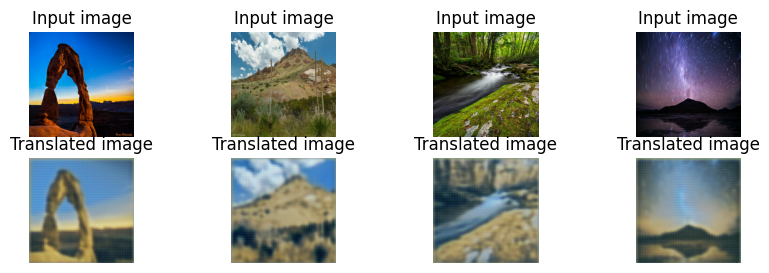

300/300 ━━━━━━━━━━━━━━━━━━━━ 127s 218ms/step - D_X_loss: 0.4307 - D_Y_loss: 0.4183 - F_loss: 4.9819 - G_loss: 5.0112
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.2555 - D_Y_loss: 0.2456 - F_loss: 3.7261 - G_loss: 3.8601

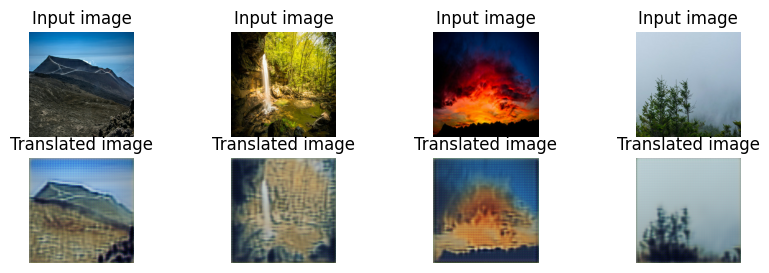

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.2560 - D_Y_loss: 0.2463 - F_loss: 3.7306 - G_loss: 3.8572
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.2370 - D_Y_loss: 0.2191 - F_loss: 3.6439 - G_loss: 3.6255

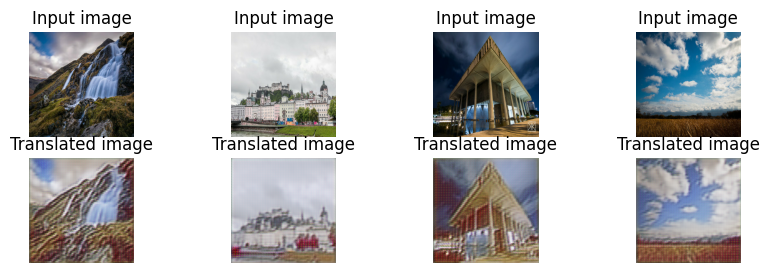

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.2369 - D_Y_loss: 0.2191 - F_loss: 3.6411 - G_loss: 3.6229
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.2245 - D_Y_loss: 0.2251 - F_loss: 3.3234 - G_loss: 3.3675

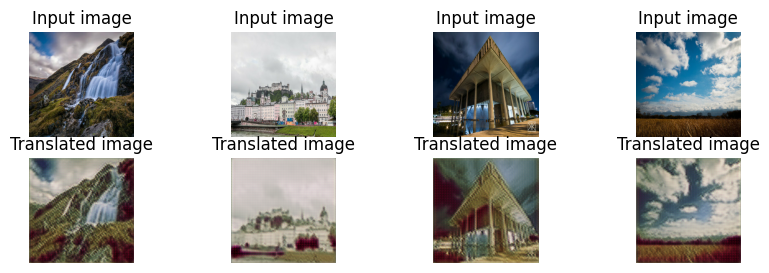

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.2244 - D_Y_loss: 0.2252 - F_loss: 3.3290 - G_loss: 3.3662
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.2398 - D_Y_loss: 0.1780 - F_loss: 3.1661 - G_loss: 3.5070

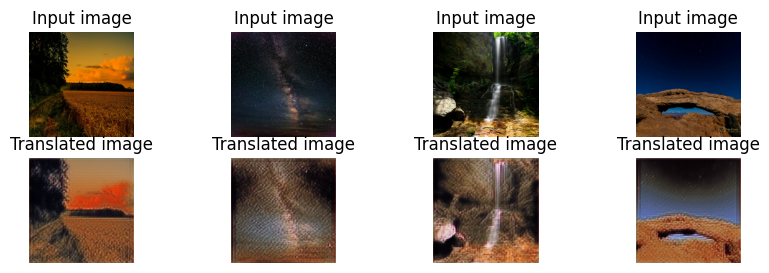

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.2400 - D_Y_loss: 0.1784 - F_loss: 3.1649 - G_loss: 3.5082
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.2321 - D_Y_loss: 0.1514 - F_loss: 3.1872 - G_loss: 3.5710

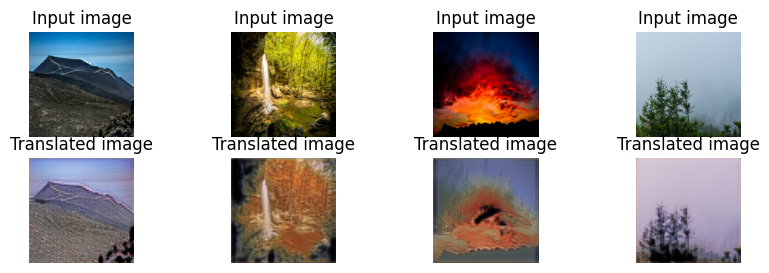

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.2324 - D_Y_loss: 0.1514 - F_loss: 3.1854 - G_loss: 3.5718
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.2243 - D_Y_loss: 0.1516 - F_loss: 3.0913 - G_loss: 3.3945

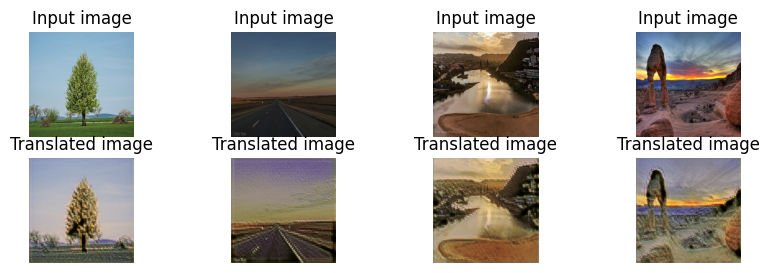

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 215ms/step - D_X_loss: 0.2241 - D_Y_loss: 0.1523 - F_loss: 3.0948 - G_loss: 3.3940
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.2300 - D_Y_loss: 0.1527 - F_loss: 3.0211 - G_loss: 3.3580

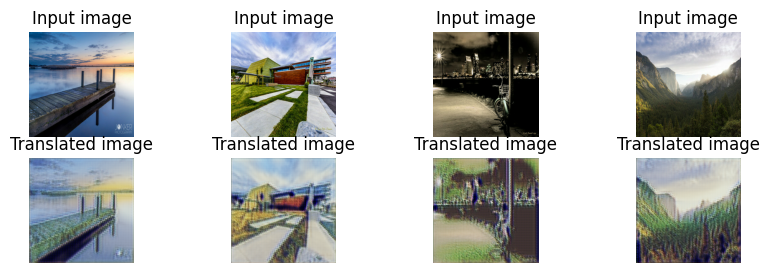

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.2296 - D_Y_loss: 0.1525 - F_loss: 3.0278 - G_loss: 3.3572
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - D_X_loss: 0.2256 - D_Y_loss: 0.1609 - F_loss: 2.9743 - G_loss: 3.2589

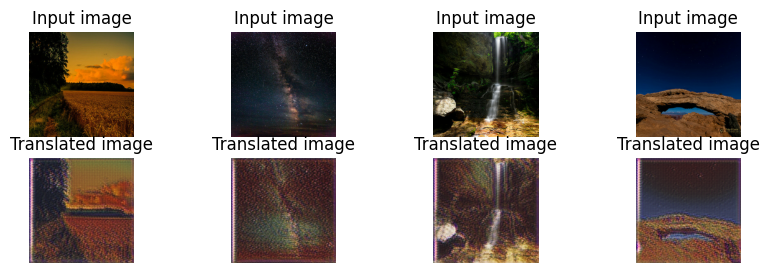

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.2253 - D_Y_loss: 0.1607 - F_loss: 2.9748 - G_loss: 3.2569
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - D_X_loss: 0.2140 - D_Y_loss: 0.1649 - F_loss: 3.0317 - G_loss: 3.2346

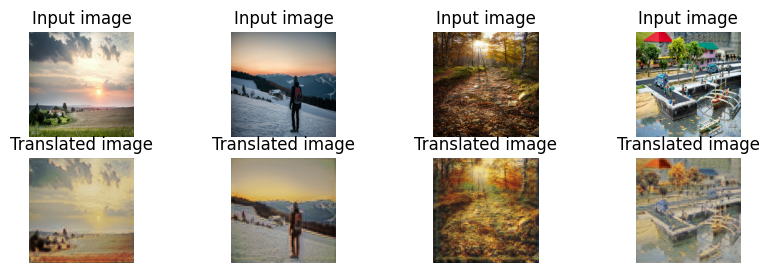

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - D_X_loss: 0.2140 - D_Y_loss: 0.1674 - F_loss: 3.0308 - G_loss: 3.2361


In [43]:
# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G = painting_generator,
    generator_F = photo_generator,
    discriminator_X = painting_discriminator,
    discriminator_Y = photo_discriminator
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
# checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.weights.h5"
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_filepath, save_weights_only=True
# )

# Train model for 10 epochs
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((photo_dataset, monet_dataset)), # Limits to 300 samples
    epochs=10,
    callbacks=[plotter], #, model_checkpoint_callback
)

The model creates very blurry images in the first few training epochs since the weights do not yet to reliably capture the image features. Interestingly, the color of the images shift dramatically toward warmer colors. The images also lack saturation and contrast, creating relatively 'flat' colored images.

The translated images show some artifacts of transformation. For example, a distinct grid like pattern can be seen, likely a consequence from upsampling transpose convolutional layers. It may be interesting to upsample beyond the resolution of the final image (up to 512x512), then downsample to the final dimensions which may improve the image resolution. These artifacts may also be from the simplified transformation layers, losing some detail without the skip connection residual layers proposed by Zhu et al.

### Generate submission file
The Kaggle competition requires images to be generated and submitted as a `.zip` file. The following code uses our trained generator to develop these images.

In [47]:
import PIL
# ! mkdir ../images

for i,img in zip(range(1),(iter(photo_dataset))):
    prediction = painting_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save("../images/" + str(i) + ".jpg")


import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'

### Hyperparameter Tuning - Cycle and Identity Loss Weights
A significant component of CycleGAN is the _cycle_. Cycle and identity processes ensure consistency for domain generators, minimizing data loss of features. As such, modifying the weight cycle and identity losses should affect the model's ability to retain important features. 

We will compare same model architecture with 0 weight for cycle and identity losses to evaluate these effects. We will also compare to doubling cycle and identity weight from the tutorial's default settings.

#### No Cycle and Identity Loss

Epoch 1/10
    300/Unknown 127s 206ms/step - D_X_loss: 0.3535 - D_Y_loss: 0.3150 - F_loss: 0.7738 - G_loss: 0.7946

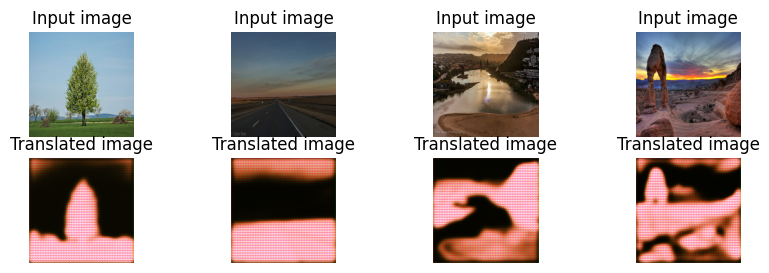

300/300 ━━━━━━━━━━━━━━━━━━━━ 128s 208ms/step - D_X_loss: 0.3529 - D_Y_loss: 0.3143 - F_loss: 0.7727 - G_loss: 0.7931
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.1984 - D_Y_loss: 0.1817 - F_loss: 0.5501 - G_loss: 0.6076

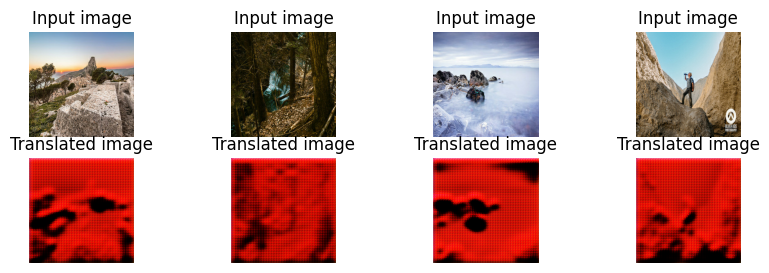

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.1986 - D_Y_loss: 0.1835 - F_loss: 0.5489 - G_loss: 0.6057
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - D_X_loss: 0.2406 - D_Y_loss: 0.1910 - F_loss: 0.3727 - G_loss: 0.5194

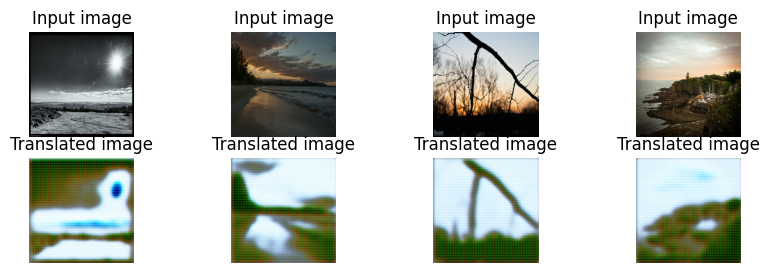

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.2408 - D_Y_loss: 0.1914 - F_loss: 0.3727 - G_loss: 0.5182
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.2167 - D_Y_loss: 0.1434 - F_loss: 0.4725 - G_loss: 0.6669

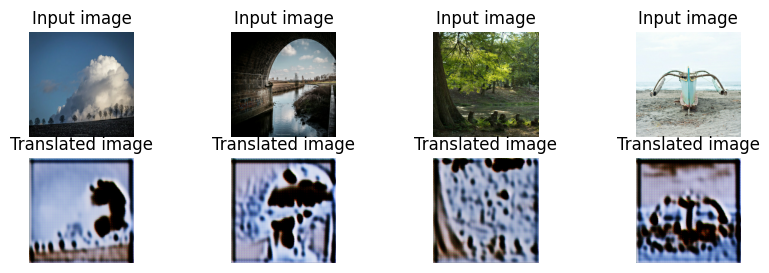

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.2174 - D_Y_loss: 0.1450 - F_loss: 0.4723 - G_loss: 0.6686
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.2279 - D_Y_loss: 0.2005 - F_loss: 0.3863 - G_loss: 0.4835

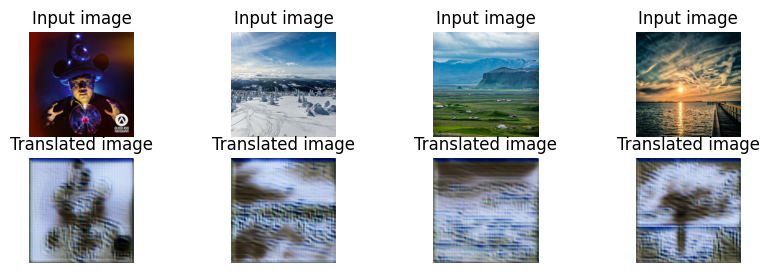

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.2276 - D_Y_loss: 0.2009 - F_loss: 0.3858 - G_loss: 0.4821
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.2312 - D_Y_loss: 0.2488 - F_loss: 0.3971 - G_loss: 0.2974

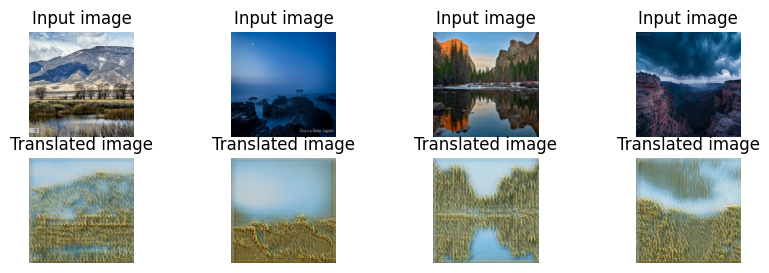

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.2313 - D_Y_loss: 0.2488 - F_loss: 0.3965 - G_loss: 0.2971
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.2337 - D_Y_loss: 0.2533 - F_loss: 0.3837 - G_loss: 0.2629

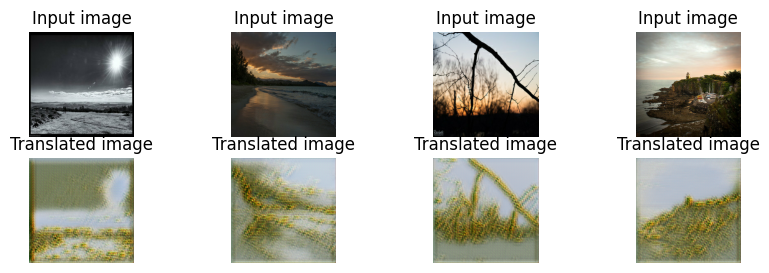

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.2341 - D_Y_loss: 0.2532 - F_loss: 0.3841 - G_loss: 0.2629
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.2082 - D_Y_loss: 0.2483 - F_loss: 0.4472 - G_loss: 0.2999

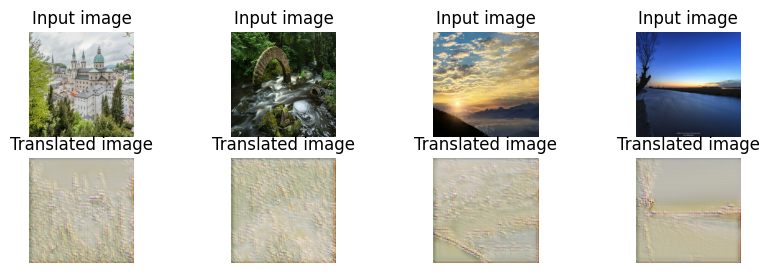

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 205ms/step - D_X_loss: 0.2079 - D_Y_loss: 0.2485 - F_loss: 0.4473 - G_loss: 0.3006
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - D_X_loss: 0.1499 - D_Y_loss: 0.2458 - F_loss: 0.6300 - G_loss: 0.3278

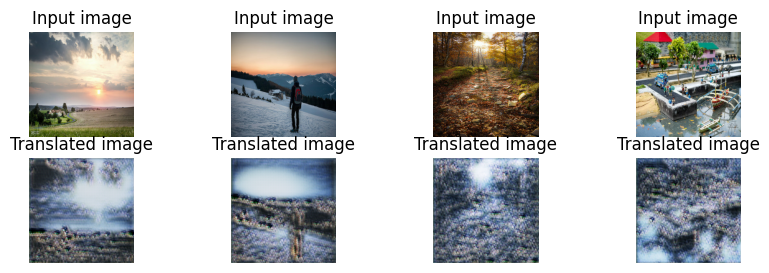

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 204ms/step - D_X_loss: 0.1496 - D_Y_loss: 0.2460 - F_loss: 0.6311 - G_loss: 0.3283
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - D_X_loss: 0.2315 - D_Y_loss: 0.2275 - F_loss: 0.3671 - G_loss: 0.4153

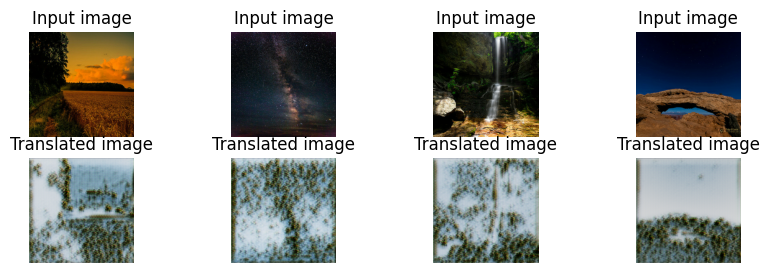

300/300 ━━━━━━━━━━━━━━━━━━━━ 61s 205ms/step - D_X_loss: 0.2316 - D_Y_loss: 0.2273 - F_loss: 0.3667 - G_loss: 0.4146


In [29]:
# No cycle or identity loss
photo_discriminator_no_cycle_identity = define_discriminator(name="Photo_Discriminator_no_cycle_identity")
painting_discriminator_no_cycle_identity = define_discriminator(name="Painting_Discriminator_no_cycle_identity")
photo_generator_no_cycle_identity = define_generator(name="Photo_Generator_no_cycle_identity")
painting_generator_no_cycle_identity = define_generator(name="Painting_Generator_no_cycle_identity")


cycle_gan_model_no_cycle_identity = CycleGan(
    generator_G = painting_generator_no_cycle_identity,
    generator_F = photo_generator_no_cycle_identity,
    discriminator_X = painting_discriminator_no_cycle_identity,
    discriminator_Y = photo_discriminator_no_cycle_identity,
    lambda_cycle = 0, ## Disable cycle loss
    lambda_identity = 0 ## Disable identity loss (technically unnecessary)
)

# Compile the model
cycle_gan_model_no_cycle_identity.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
# checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.weights.no.lambda"
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_filepath, save_weights_only=True
# )

# Train model for 10 epochs
cycle_gan_model_no_cycle_identity.fit(
    tf.data.Dataset.zip((photo_dataset, monet_dataset)),
    epochs=10,
    callbacks=[plotter], #, model_checkpoint_callback
)

The model performs much worse without any cycle or identity losses. The adversarial losses alone are much smaller than the original total model loss, resulting in smaller gradients and therefore smaller updates to model weights. Given more training epochs, the model may suffer from vanishing gradients which further hinder performance.

The model loses a lot of key information without considering cycle/identity losses. This is apparent where all translated images are monochromatic. The translated images seem to capture value attempting to distinguish light and dark. The model fails to learn these color effects without cycle losses to confirm key information is maintained. The model appears to detect edges as the model is trained further, and given more training may develop more advanced features like color.

Consider that both the photo and painting generators lack feedback about one another without cycle or identity losses. Essentially both generators are functioning as independent DCGANs but using autoencoders to generate the feature space from images instead of using random noise.

#### Doubling Cycle Weight (which also doubles Identity Weight

Unsurprisingly, removing cycle and identity loss greatly hinders model performance. Increasing the weight of these losses would bias the generators to recreate the original image, which may reduce its ability to adopt the other domain's style. To test this, the below model doubles the cycle weight which also doubles the identity weight.

Epoch 1/10
    300/Unknown 131s 217ms/step - D_X_loss: 0.4015 - D_Y_loss: 0.3854 - F_loss: 9.2903 - G_loss: 9.2666

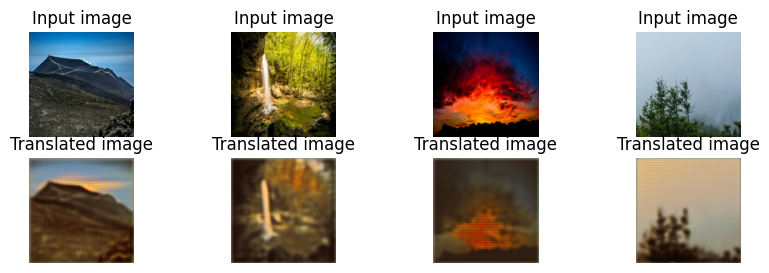

300/300 ━━━━━━━━━━━━━━━━━━━━ 131s 219ms/step - D_X_loss: 0.4008 - D_Y_loss: 0.3844 - F_loss: 9.2802 - G_loss: 9.2571
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - D_X_loss: 0.2239 - D_Y_loss: 0.2187 - F_loss: 7.0650 - G_loss: 7.2271

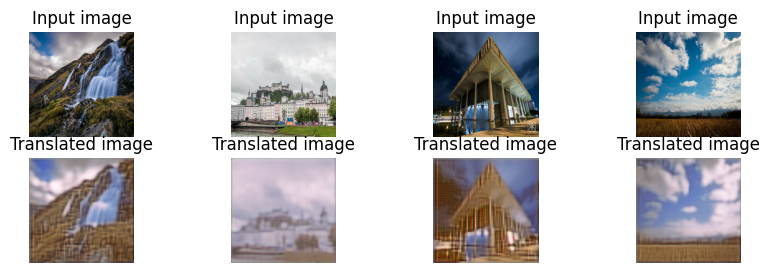

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 216ms/step - D_X_loss: 0.2237 - D_Y_loss: 0.2185 - F_loss: 7.0600 - G_loss: 7.2252
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.2078 - D_Y_loss: 0.1866 - F_loss: 6.4333 - G_loss: 6.4529

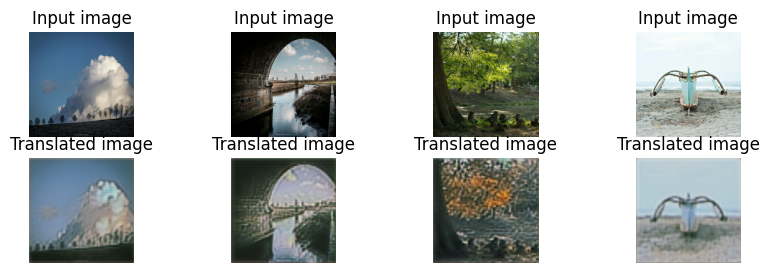

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.2077 - D_Y_loss: 0.1865 - F_loss: 6.4308 - G_loss: 6.4482
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.1805 - D_Y_loss: 0.1856 - F_loss: 6.1658 - G_loss: 6.1614

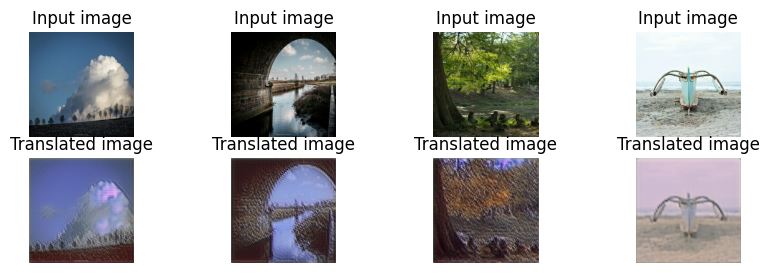

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 215ms/step - D_X_loss: 0.1814 - D_Y_loss: 0.1857 - F_loss: 6.1763 - G_loss: 6.1587
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.1860 - D_Y_loss: 0.1903 - F_loss: 5.9511 - G_loss: 5.9521

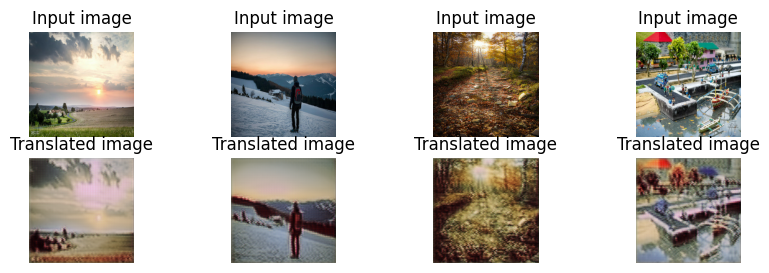

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.1857 - D_Y_loss: 0.1905 - F_loss: 5.9585 - G_loss: 5.9482
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.1964 - D_Y_loss: 0.1928 - F_loss: 5.8644 - G_loss: 5.8215

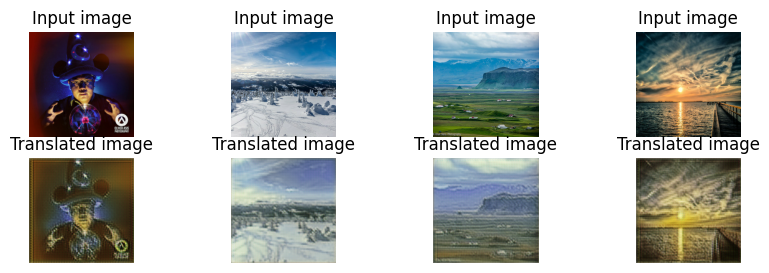

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 215ms/step - D_X_loss: 0.1962 - D_Y_loss: 0.1930 - F_loss: 5.8674 - G_loss: 5.8136
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - D_X_loss: 0.1821 - D_Y_loss: 0.1804 - F_loss: 5.7392 - G_loss: 5.7218

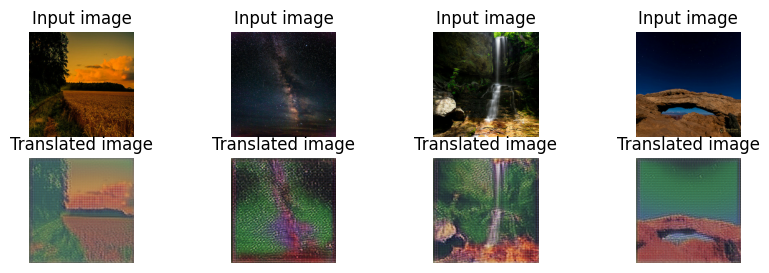

300/300 ━━━━━━━━━━━━━━━━━━━━ 64s 214ms/step - D_X_loss: 0.1817 - D_Y_loss: 0.1807 - F_loss: 5.7439 - G_loss: 5.7174
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.1833 - D_Y_loss: 0.1845 - F_loss: 5.5954 - G_loss: 5.6528

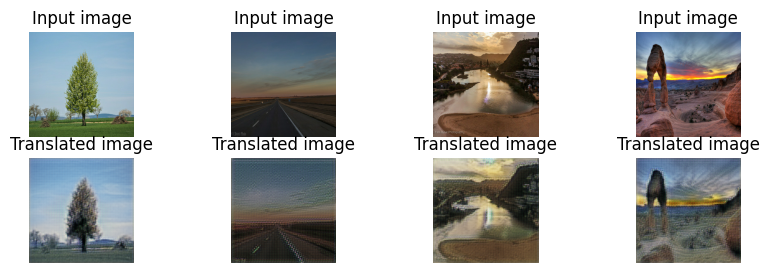

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.1832 - D_Y_loss: 0.1848 - F_loss: 5.6064 - G_loss: 5.6467
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.1894 - D_Y_loss: 0.1825 - F_loss: 5.4464 - G_loss: 5.4819

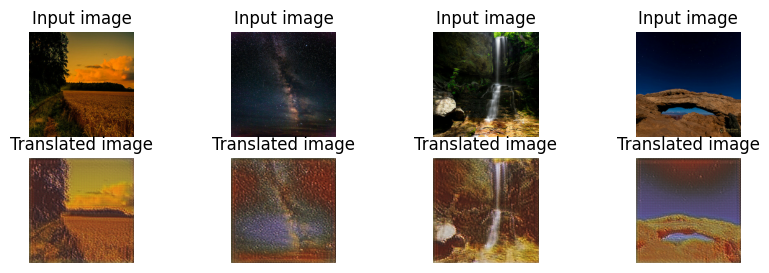

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.1896 - D_Y_loss: 0.1829 - F_loss: 5.4549 - G_loss: 5.4794
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - D_X_loss: 0.1850 - D_Y_loss: 0.1773 - F_loss: 5.3822 - G_loss: 5.4342

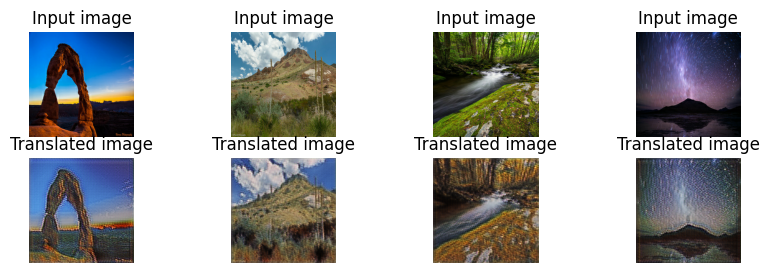

300/300 ━━━━━━━━━━━━━━━━━━━━ 65s 215ms/step - D_X_loss: 0.1849 - D_Y_loss: 0.1779 - F_loss: 5.3803 - G_loss: 5.4329


In [32]:
# Double cycle (and therefore identity) loss
photo_discriminator_double_cycle = define_discriminator(name="Photo_Discriminator_double_cycle")
painting_discriminator_double_cycle = define_discriminator(name="Painting_Discriminator_double_cycle")
photo_generator_double_cycle = define_generator(name="Photo_Generator_double_cycle")
painting_generator_double_cycle = define_generator(name="Painting_Generator_double_cycle")

cycle_gan_model_double_cycle = CycleGan(
    generator_G = painting_generator_double_cycle,
    generator_F = photo_generator_double_cycle,
    discriminator_X = painting_discriminator_double_cycle,
    discriminator_Y = photo_discriminator_double_cycle,
    lambda_cycle = 20, ## Double cycle loss
)

# Compile the model
cycle_gan_model_double_cycle.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
# checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.weights.no.lambda"
# model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_filepath, save_weights_only=True
# )

# Train model for 10 epochs
cycle_gan_model_double_cycle.fit(
    tf.data.Dataset.zip((photo_dataset, monet_dataset)),
    epochs=10,
    callbacks=[plotter], #, model_checkpoint_callback
)

Doubling the cycle loss did not dramatically affect results, though it seemed to have more unusual color variation. Though not quantified, the colors of the original photo appear better maintained in the translated image than in the original model. This result would be consistent with prioritizing cycle and identity loss over adversarial loss, though is qualitative speculation.

Increasing cycle and identity loss may have diminishing effects if cycle and identity were already quite large. Consider comparing the no-cycle-identity model with a generator loss around 0.4 after 10 epochs to the double-cycle-identity model with a generator loss around 5.4. This indicates the adversarial loss is quite small compared to the cycle and identity loss to begin with.

### Alternative Architecture - UNet-based Generator
Many projects listed in the Kaggle competition utilize UNet-based generators. UNet is derived from fully convolutional neural networks which exclusively use convolutional layers. The 'U' in UNet describes the U shaped architecture, which is functionally similar to an autoencoder by downsampling via convolution then upsampling via tranpose convolution. The distinguishing feature of UNet is skip connections from the encoder layers to the decoder layers. These skip connections help preserve spatial detail from previous layers that may otherwise be lost in the encoding process.

The below code modifies the generator, incorporating a skip connection. Another CycleGAN model is then built and trained, allowing cycle and identify losses as before.

In [33]:
## UNet Generator
from tensorflow.keras.layers import Layer

class ConcatenateLayer(Layer):
    def call(self, inputs):
        return tf.concat(inputs, axis=-1)  # Perform concatenation

def define_unet_generator(name):
    inputs = tf.keras.Input(shape=(256, 256, 3))
    # Encoding
    down1 = Conv2D(64, kernel_size=3, strides=1, padding="same")(inputs)
    down1 = GroupNormalization()(down1) # axis=[0,1] applies as instance norm
    down1 = ReLU()(down1)

    down2 = Conv2D(128, kernel_size=3, strides=2, padding="same")(down1)
    down2 = GroupNormalization()(down2)
    down2 = ReLU()(down2)

    down3 = Conv2D(256, kernel_size=3, strides=2, padding="same")(down2)
    down3 = GroupNormalization()(down3)
    down3 = ReLU()(down3)
    # Transformation x3 (Instead of residual blocks)
    x = down3
    for i in range(3):
        x = Conv2D(256, kernel_size=3, strides=1, padding="same")(x)
        x = GroupNormalization()(x)
        x = ReLU()(x)
    # Decoding
    up2 = Conv2DTranspose(128, kernel_size=3, strides=2, padding="same")(x)
    up2 = GroupNormalization()(up2)
    up2 = ReLU()(up2)
    up2 = ConcatenateLayer()([up2, down2]) # Skip connection

    up1 = Conv2DTranspose(64, kernel_size=3, strides=2, padding="same")(up2)
    up1 = GroupNormalization()(up1)
    up1 = ReLU()(up1)
    # up1 = ConcatenateLayer()([up1, down1]) # Skip connection

    outputs = Conv2D(3, kernel_size=7, strides=1, padding="same", activation="tanh")(up1)

    return tf.keras.Model(inputs, outputs, name=name)

photo_generator_unet = define_unet_generator(name="Photo_Generator_UNet")
painting_generator_unet = define_unet_generator(name="Painting_Generator_UNet")

## Define discriminators
photo_discriminator_unet = define_discriminator(name="Photo_Discriminator_UNet")
painting_discriminator_unet = define_discriminator(name="Painting_Discriminator_UNet")

Epoch 1/10
    300/Unknown 133s 228ms/step - D_X_loss: 0.4102 - D_Y_loss: 0.4152 - F_loss: 3.8988 - G_loss: 3.8966

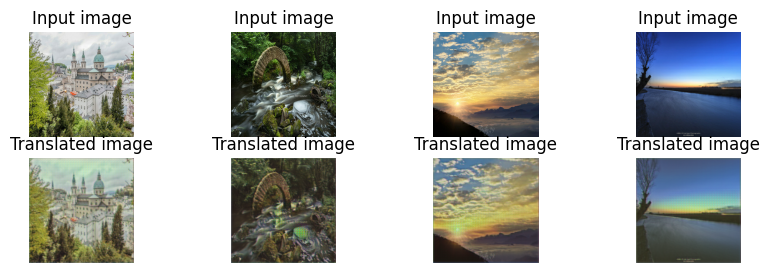

300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 230ms/step - D_X_loss: 0.4104 - D_Y_loss: 0.4152 - F_loss: 3.8949 - G_loss: 3.8890
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2512 - D_Y_loss: 0.2468 - F_loss: 2.6336 - G_loss: 2.6277

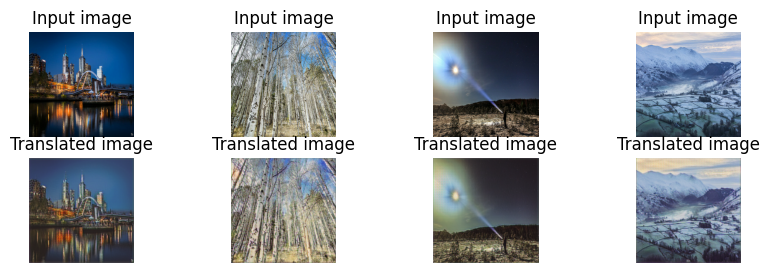

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2513 - D_Y_loss: 0.2468 - F_loss: 2.6312 - G_loss: 2.6248
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - D_X_loss: 0.2477 - D_Y_loss: 0.2422 - F_loss: 2.4333 - G_loss: 2.3598

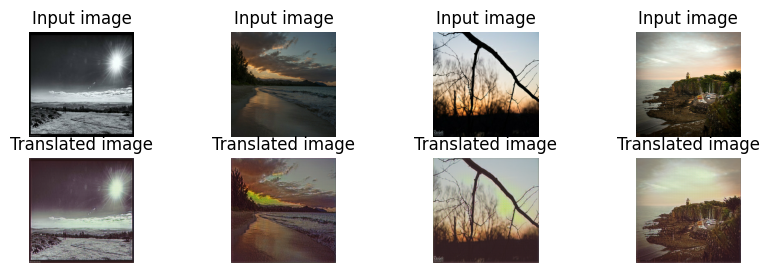

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 225ms/step - D_X_loss: 0.2478 - D_Y_loss: 0.2421 - F_loss: 2.4412 - G_loss: 2.3608
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2380 - D_Y_loss: 0.2357 - F_loss: 2.2735 - G_loss: 2.2265

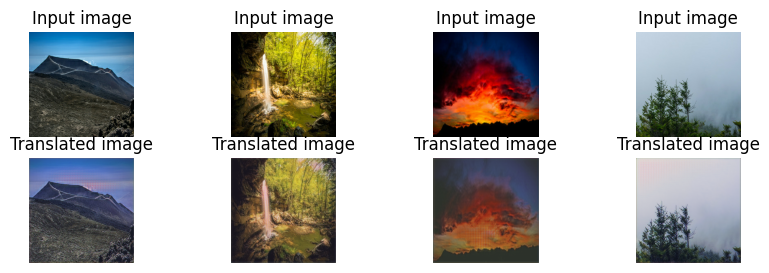

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2391 - D_Y_loss: 0.2371 - F_loss: 2.2805 - G_loss: 2.2263
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2305 - D_Y_loss: 0.2221 - F_loss: 2.2279 - G_loss: 2.1615

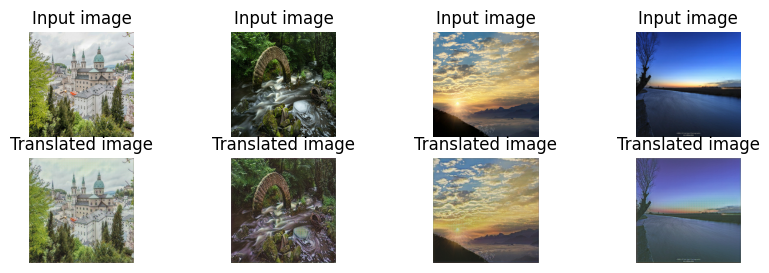

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2306 - D_Y_loss: 0.2223 - F_loss: 2.2279 - G_loss: 2.1612
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2221 - D_Y_loss: 0.2189 - F_loss: 2.1584 - G_loss: 2.0894

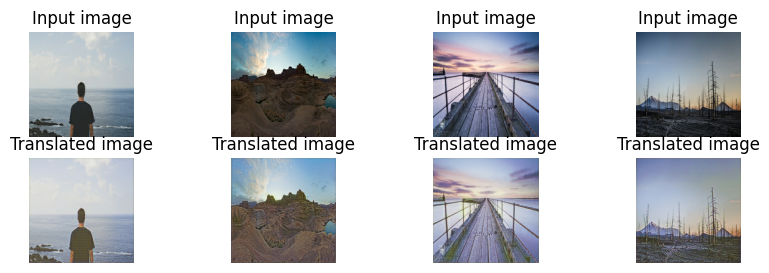

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2218 - D_Y_loss: 0.2187 - F_loss: 2.1584 - G_loss: 2.0892
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2225 - D_Y_loss: 0.2129 - F_loss: 2.1466 - G_loss: 2.0658

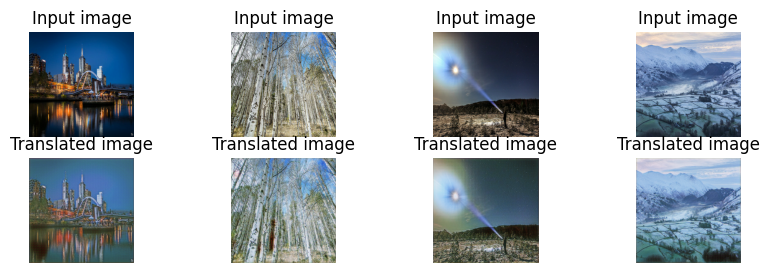

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2226 - D_Y_loss: 0.2133 - F_loss: 2.1462 - G_loss: 2.0673
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2244 - D_Y_loss: 0.2181 - F_loss: 1.9989 - G_loss: 1.9601

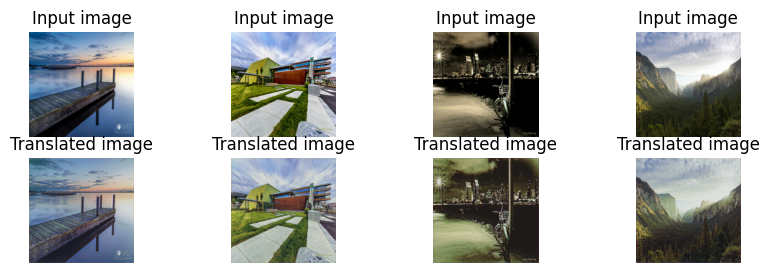

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2248 - D_Y_loss: 0.2187 - F_loss: 1.9982 - G_loss: 1.9585
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2212 - D_Y_loss: 0.2114 - F_loss: 2.0792 - G_loss: 1.9688

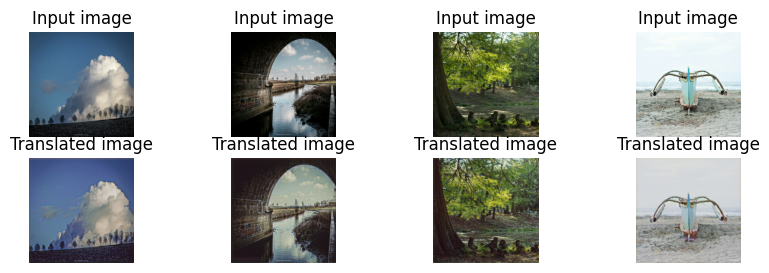

300/300 ━━━━━━━━━━━━━━━━━━━━ 71s 236ms/step - D_X_loss: 0.2215 - D_Y_loss: 0.2119 - F_loss: 2.0762 - G_loss: 1.9680
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - D_X_loss: 0.2206 - D_Y_loss: 0.2142 - F_loss: 2.0246 - G_loss: 1.9043

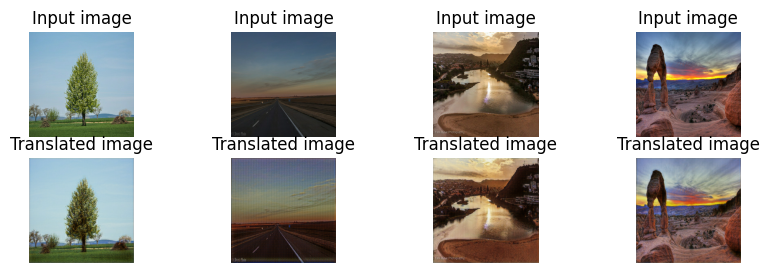

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 226ms/step - D_X_loss: 0.2204 - D_Y_loss: 0.2139 - F_loss: 2.0305 - G_loss: 1.9060


In [34]:
# Create CycleGAN UNet model
cycle_gan_model_unet = CycleGan(
    generator_G = painting_generator_unet,
    generator_F = photo_generator_unet,
    discriminator_X = painting_discriminator_unet,
    discriminator_Y = photo_discriminator_unet
)

# Compile the model
cycle_gan_model_unet.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()

# Train model for 10 epochs
cycle_gan_model_unet.fit(
    tf.data.Dataset.zip((photo_dataset, monet_dataset)), # Limits to 300 samples
    epochs=10,
    callbacks=[plotter], #, model_checkpoint_callback
)

The skip connections appear to preserve detail following the encoding at the expense of overriding the painterly aspects of the original implementation.

The skip connections in the above model connect the 2nd downsampling and 2nd-to-last upsampling layers. In Zhu et. al's suggested implementation, the skip connections occur within the bottleneck residual blocks _after_ the image has been fully convoluted to the feature space. The skip connection in this UNet implementation seems to overwhelm the decoding with original input information, and as such the results are less painterly.

This particular skip connection hurts model performance by reducing the generator's decoding effects. A different implementation as residual blocks or within a deeper autoencoder network may better balance the detail-retaining effects provided by this architecture. 

---
## __Conclusion__
The goal of this project was to develop a GAN capable of converting photos into a Monet-style painting. This was accomplished using CycleGAN with simplified transformation units.

Several alternative models were studied, including adjusted cycle and identity loss as well as skip connections similar to UNet architectures. Removing cycle and identity loss clearly reduced model performance, effectively losing all color information and simply detecting image edges. Increasing cycle and identity loss did not dramatically affect performance, perhaps since cycle and identity loss were already highly weighted. The skip connection based on the common UNet architecture seemed to add too much detail, essentially allowing data to skip the encoding/decoding process. While this improved image resolution/detail, it reduced the desired painterly effect. 

There are many opportunities to improve or build upon this project, including: 
* __Sample Variation__ - Many GAN examples include sections preparing sample variations from their data set. This includes adding noise, jitter, mirroring data, cropping subsections, all of which should result in a more robust generator/discriminator.
* __Residual Bottleneck layers__ - The models in this project simplified the 'bottleneck' transformation layers of the autoencoder. Zhu et. al recommends many more residual layer blocks which incorporate skip connections in each block, designed to help in information retention.
* __Incremental Dimension Training__ - A larger scale project could consider incremental training of the generators and discriminators, gradually increasing generator output dimensions after training on smaller dimensions.
* __Additional styles__ - Monet's art style likely works well with GANs since the focus of Impressionism is not photo-realism. Thus, it is interesting to consider how GANs would reproduce more complex or abstract art styles such as Dali or Picasso.  

---
## __References__
* "CycleGAN" from Keras - https://keras.io/examples/generative/cyclegan/ -> Informed overall system design and provided code for CycleGAN class implementation.
* "Monet CycleGAN Tutorial" - https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial#Create-submission-file -> Used to understand Kaggle implementation such as downloading data and generating output. 
* "CycleGAN" from TensorFlow - https://www.tensorflow.org/tutorials/generative/cyclegan
* "ResNets - Residual Blocks & Deep Residual Learning" - https://towardsdatascience.com/resnets-residual-blocks-deep-residual-learning-a231a0ee73d2/